#### Importar librerías generales

In [545]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib.patches as mpatches
import time
from time import time
np.random.seed(0)

#### Importar librerías de clasificación

In [547]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import matthews_corrcoef
import collections

In [548]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold
import warnings
warnings.filterwarnings("ignore")

#### Variables de escalamiento

In [549]:
from sklearn.preprocessing import StandardScaler, RobustScaler

#### Split the data

In [550]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit

#### Librerías para SMOTE

In [552]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV

#### Librería para imprimir resultado de modelo Random Forest

In [553]:
from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image
from IPython import display
from sklearn import tree
import pydotplus

#### Librerias para Naive Bayes

In [554]:
from sklearn.naive_bayes import GaussianNB

#### Librerías para Neural Network

In [555]:
import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers import Activation
from tensorflow.python.keras.layers import Input, Dense
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy
from sklearn.neural_network import MLPClassifier

#### Libreria para metrica confussion matrix

In [556]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
import sklearn.metrics as metrics
import itertools

#### Librerias para interpretabilidad de modelos

In [557]:
import lime
import lime.lime_tabular

In [558]:
df = pd.read_csv('Europeancardholders.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [559]:
df.shape

(284807, 31)

In [560]:
df['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [561]:
# The classes are heavily skewed we need to solve this issue later.
print('No fraulentas', round(df['Class'].value_counts()[0]/len(df) * 100,2), '% del dataset')
print('Fraulentas', round(df['Class'].value_counts()[1]/len(df) * 100,2), '% del dataset')

No fraulentas 99.83 % del dataset
Fraulentas 0.17 % del dataset


Text(0.5, 1.0, 'Distribución de Class \n (0: No Fraude || 1: Fraude)')

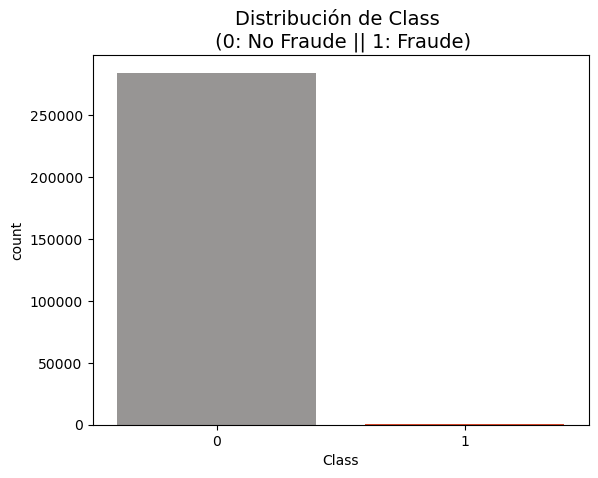

In [562]:
colors = ["#979594", "#F7360D"]

sns.countplot('Class', data=df, palette=colors)
plt.title('Distribución de Class \n (0: No Fraude || 1: Fraude)', fontsize=14)

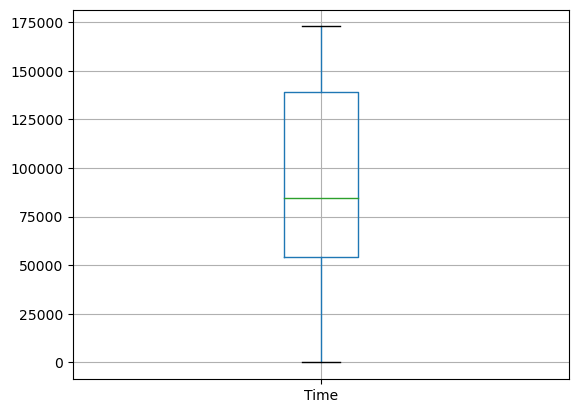

In [563]:
boxplot = df.boxplot(column=['Time'])

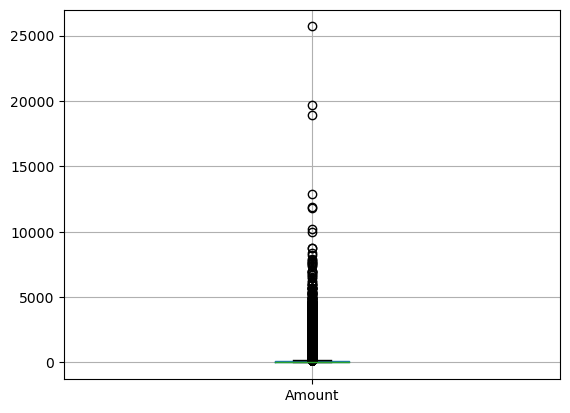

In [564]:
boxplot = df.boxplot(column=['Amount'])

count    284807.000000
mean      94813.859575
std       47488.145955
min           0.000000
25%       54201.500000
50%       84692.000000
75%      139320.500000
max      172792.000000
Name: Time, dtype: float64


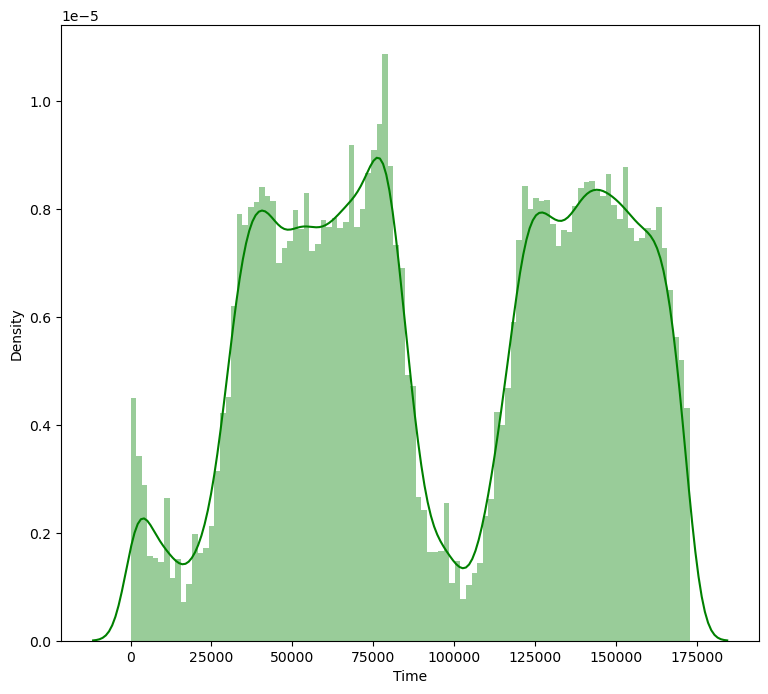

In [565]:
print(df['Time'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(df['Time'], color='g', bins=100, hist_kws={'alpha': 0.4});

count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64


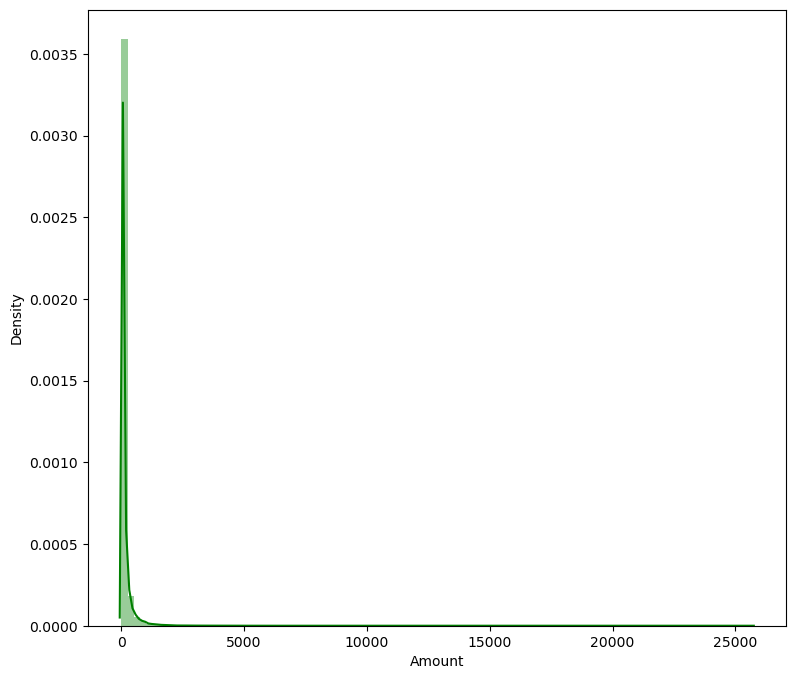

In [566]:
print(df['Amount'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(df['Amount'], color='g', bins=100, hist_kws={'alpha': 0.4});

## Escalamiento y distribución

### Escalamiento de las variables Time y Amount

In [567]:
# Datos escalados son menos propenso a los valores atípicos.

std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df['scaled_amount'] = rob_scaler.fit_transform(df['Amount'].values.reshape(-1,1))
df['scaled_time'] = rob_scaler.fit_transform(df['Time'].values.reshape(-1,1))

df.drop(['Time','Amount'], axis=1, inplace=True)

In [568]:
scaled_amount = df['scaled_amount']
scaled_time = df['scaled_time']

df.drop(['scaled_amount', 'scaled_time'], axis=1, inplace=True)
df.insert(0, 'samount', scaled_amount)
df.insert(1, 'stime', scaled_time)

In [569]:
df.head()

,samount,stime,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,1.783274,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,-0.269825,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,4.983721,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,1.418291,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,0.670579,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0


In [570]:
df.describe()

,samount,stime,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
count,284807.000000,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000
mean,0.927124,0.118914,3.918649e-15,5.682686e-16,-8.761736e-15,2.811118e-15,-1.552103e-15,2.040130e-15,-1.698953e-15,-1.893285e-16,...,5.126845e-16,1.473120e-16,8.042109e-16,5.282512e-16,4.456271e-15,1.426896e-15,1.701640e-15,-3.662252e-16,-1.217809e-16,0.001727
std,3.495006,0.557903,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,...,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,0.041527
min,-0.307413,-0.994983,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,...,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000
25%,-0.229162,-0.358210,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,...,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,0.000000
50%,0.000000,0.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,...,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,0.000000
75%,0.770838,0.641790,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,...,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,0.000000
max,358.683155,1.035022,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,...,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,1.000000


#### Splitting la data

In [571]:
print('No Fraude', round(df['Class'].value_counts()[0]/len(df) * 100,2), '% del dataset')
print('Fraude', round(df['Class'].value_counts()[1]/len(df) * 100,2), '% del dataset')

X = df.drop('Class', axis=1)
y = df['Class']

sss = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)

for train_index, test_index in sss.split(X, y):
    print("Train:", train_index, "Test:", test_index)
    original_Xtrain, original_Xtest = X.iloc[train_index], X.iloc[test_index]
    original_ytrain, original_ytest = y.iloc[train_index], y.iloc[test_index]

# Ya tenemos X_train y y_train para undersample data por eso uso la original para distinguir y no sobreescribir estas
# variables.
# original_Xtrain, original_Xtest, original_ytrain, original_ytest = train_test_split(X, y, test_size=0.2, random_state=42)

# Verificar la distribución de las etiquetas

# Convertirlos en arreglos
original_Xtrain1 = original_Xtrain.values
original_Xtest1 = original_Xtest.values
original_ytrain1 = original_ytrain.values
original_ytest1 = original_ytest.values

# Observar si la distribucion de los labels de train y test son equitativos
train_unique_label, train_counts_label = np.unique(original_ytrain, return_counts=True)
test_unique_label, test_counts_label = np.unique(original_ytest, return_counts=True)
print('-' * 100)

print('Distribución de etiquetas: \n')
print(train_counts_label/ len(original_ytrain))
print(test_counts_label/ len(original_ytest))

No Fraude 99.83 % del dataset
Fraude 0.17 % del dataset
Train: [ 30473  30496  31002 ... 284804 284805 284806] Test: [    0     1     2 ... 57017 57018 57019]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 30473  30496  31002 ... 113964 113965 113966]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 81609  82400  83053 ... 170946 170947 170948]
Train: [     0      1      2 ... 284804 284805 284806] Test: [150654 150660 150661 ... 227866 227867 227868]
Train: [     0      1      2 ... 227866 227867 227868] Test: [212516 212644 213092 ... 284804 284805 284806]
----------------------------------------------------------------------------------------------------
Distribución de etiquetas: 

[0.99827076 0.00172924]
[0.99827952 0.00172048]


In [572]:
# Función para reportar el mejor score
def report(results, n_top=10):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results["rank_test_score"] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print(
                "Mean validation score: {0:.3f} (std: {1:.3f})".format(
                    results["mean_test_score"][candidate],
                    results["std_test_score"][candidate],
                )
            )
            print("Parameters: {0}".format(results["params"][candidate]))
            print("")



#### RandomizedSearchCV + Random forest

In [574]:
print('Longuitud de X (entrenamiento): {} | Longuitud de y (entrenamiento): {}'.format(len(original_Xtrain), len(original_ytrain)))
print('Longuitud de X (test): {} | Longuitud de y (test): {}'.format(len(original_Xtest), len(original_ytest)))

# Lista para añadir el score y luego encontrar el promedio
accuracy_lst = []
precision_lst = []
recall_lst = []
f1_lst = []
auc_lst = []
mcc_lst = []

# Clasificador con parámetros óptimos
rf_classifier = RandomForestClassifier(n_estimators=10)
rf_params = {"criterion": ["gini"], "max_depth": list(range(2,5,1)), 
              "max_leaf_nodes": list(range(5,21,1)),"min_samples_split":list(range(2,3,1))}
randomized_forest = RandomizedSearchCV(rf_classifier, rf_params, n_iter=4)

# Implementando la técnica SMOTE
# Validación cruzada la vía correcta
# Parámetros

#log_reg_params = {"penalty": ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
start = time()
for train, test in sss.split(original_Xtrain1, original_ytrain1):
    pipelinerf = imbalanced_make_pipeline(SMOTE(sampling_strategy='minority'), randomized_forest) # SMOTE happens during Cross Validation not before..
    modelrf = pipelinerf.fit(original_Xtrain1[train], original_ytrain1[train])
    best_estrf = randomized_forest.best_estimator_
    predictionrf = randomized_forest.predict(original_Xtrain1[test])
    
    accuracy_lst.append(pipelinerf.score(original_Xtrain1[test], original_ytrain1[test]))
    precision_lst.append(precision_score(original_ytrain1[test], predictionrf))
    recall_lst.append(recall_score(original_ytrain1[test], predictionrf))
    f1_lst.append(f1_score(original_ytrain1[test], predictionrf))
    auc_lst.append(roc_auc_score(original_ytrain1[test], predictionrf))
    mcc_lst.append(matthews_corrcoef(original_ytrain1[test], predictionrf))

print('---' * 45)
print(
    "RandomizedSearchCV toma %.2f segundos para %d configuración de los parámetros candidatos."
    % (time() - start, len(randomized_forest.cv_results_["params"]))
)
report(randomized_forest.cv_results_)

print('---' * 45)
print('')
print("exactitud: {}".format(np.mean(accuracy_lst)))
print("precision: {}".format(np.mean(precision_lst)))
print("recall: {}".format(np.mean(recall_lst)))
print("f1: {}".format(np.mean(f1_lst)))
print("auc: {}".format(np.mean(auc_lst)))
print("mcc: {}".format(np.mean(mcc_lst)))
print('---' * 45)

Longuitud de X (entrenamiento): 227846 | Longuitud de y (entrenamiento): 227846
Longuitud de X (test): 56961 | Longuitud de y (test): 56961
---------------------------------------------------------------------------------------------------------------------------------------
RandomizedSearchCV toma 1093.00 segundos para 4 configuración de los parámetros candidatos.
Model with rank: 1
Mean validation score: 0.932 (std: 0.012)
Parameters: {'min_samples_split': 2, 'max_leaf_nodes': 18, 'max_depth': 4, 'criterion': 'gini'}

Model with rank: 2
Mean validation score: 0.932 (std: 0.002)
Parameters: {'min_samples_split': 2, 'max_leaf_nodes': 9, 'max_depth': 3, 'criterion': 'gini'}

Model with rank: 3
Mean validation score: 0.930 (std: 0.002)
Parameters: {'min_samples_split': 2, 'max_leaf_nodes': 10, 'max_depth': 2, 'criterion': 'gini'}

Model with rank: 4
Mean validation score: 0.929 (std: 0.003)
Parameters: {'min_samples_split': 2, 'max_leaf_nodes': 12, 'max_depth': 2, 'criterion': 'gini'}

-

In [575]:
print(best_estrf.feature_importances_)

[8.67730756e-04 1.66201095e-04 5.53628592e-04 6.48508563e-03
 7.83137542e-02 1.12072292e-01 6.53527461e-04 4.84703678e-03
 7.19901040e-02 1.55427117e-03 1.79866199e-05 4.92920706e-02
 1.09944373e-01 1.74872473e-01 4.53449923e-03 1.23492653e-01
 5.79913527e-04 1.49177973e-01 9.06966330e-02 3.98071206e-03
 2.68620556e-03 2.43169924e-03 6.69062588e-04 8.60640345e-05
 9.03516053e-04 9.66750258e-04 9.85752548e-04 5.69225422e-04
 6.45833399e-03 1.50470789e-04]


#### Importancia de las características

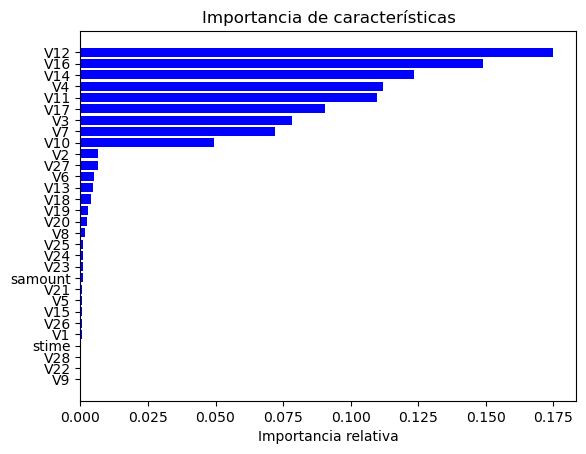

In [576]:
importances = best_estrf.feature_importances_
indices = np.argsort(importances)

features = original_Xtrain.columns
plt.title('Importancia de características')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)),[features[i] for i in indices])
plt.xlabel('Importancia relativa')
plt.show()

In [577]:
print(pipelinerf.predict_proba([original_Xtest.iloc[0]]))

[[0.10101737 0.89898263]]


In [578]:
predict_fn_rf = lambda x: pipelinerf.predict_proba(x).astype(float)
X = original_Xtrain.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = original_Xtrain.columns,class_names=['Fraude','No Fraude'],kernel_width=5)

In [579]:
original_Xtest.head()

,samount,stime,V1,V2,V3,V4,V5,V6,V7,V8,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
212516,-0.307273,0.636779,-1.298443,1.948100,-4.509947,1.305805,-0.019486,-0.509238,-2.643398,1.283545,...,0.152892,0.250415,1.178032,1.360989,-0.272013,-0.325948,0.290703,0.841295,0.643094,0.201156
212644,9.863900,0.637343,-2.356348,1.746360,-6.374624,1.772205,-3.439294,1.457811,-0.362577,1.443791,...,-0.663371,0.194810,0.857942,0.621203,0.964817,-0.619437,-1.732613,0.108361,1.130828,0.415703
213092,0.006567,0.639281,-4.666500,-3.952320,0.206094,5.153525,5.229469,0.939040,-0.635033,-0.704506,...,1.060154,-2.286137,-0.664263,1.821422,0.113563,-0.759673,-0.502304,0.630639,-0.513880,0.729526
213116,-0.191434,0.639399,-3.975939,-1.244939,-3.707414,4.544772,4.050676,-3.407679,-5.063118,1.007042,...,3.569733,2.109403,1.059737,-0.037395,0.348707,-0.162929,0.410531,-0.123612,0.877424,0.667568
214662,1.376930,0.647035,0.467992,1.100118,-5.607145,2.204714,-0.578539,-0.174200,-3.454201,1.102823,...,-0.173814,0.589575,0.983481,0.899876,-0.285103,-1.929717,0.319869,0.170636,0.851798,0.372098


In [580]:
original_Xtest.tail()

,samount,stime,V1,V2,V3,V4,V5,V6,V7,V8,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
284802,-0.296653,1.034951,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,...,-0.682920,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731
284803,0.038986,1.034963,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,...,-1.545556,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527
284804,0.641096,1.034975,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,...,-0.577252,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561
284805,-0.167680,1.034975,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,...,2.897849,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533
284806,2.724796,1.035022,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,...,-0.256117,0.382948,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649


#### Primera instancia

In [581]:
choosen_instance = original_Xtest.loc[[212516]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=5)
exp.show_in_notebook(show_table=True,show_all=False)

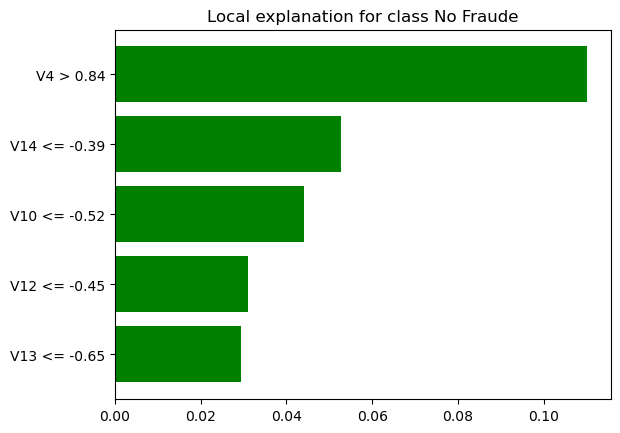

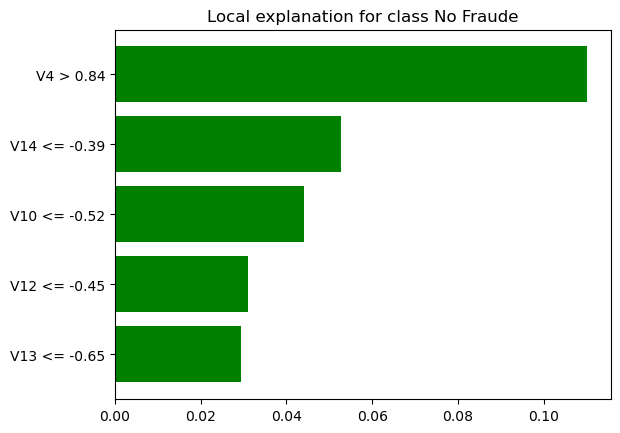

In [582]:
exp.as_pyplot_figure()

In [583]:
pd.DataFrame(exp.as_list())

,0,1
0,V4 > 0.84,0.110165
1,V14 <= -0.39,0.052683
2,V10 <= -0.52,0.044078
3,V12 <= -0.45,0.031013
4,V13 <= -0.65,0.029377


In [584]:
pd.DataFrame(exp.as_list())[1].sum()

0.2673157630685762

#### Segunda instancia

In [585]:
choosen_instance = original_Xtest.loc[[284806]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=5)
exp.show_in_notebook(show_table=True, show_all=False)

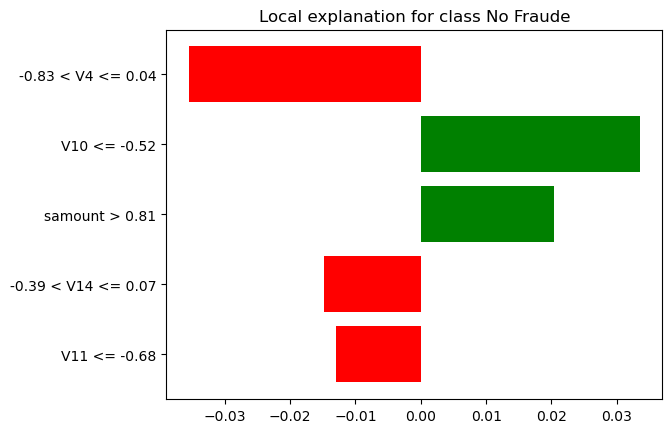

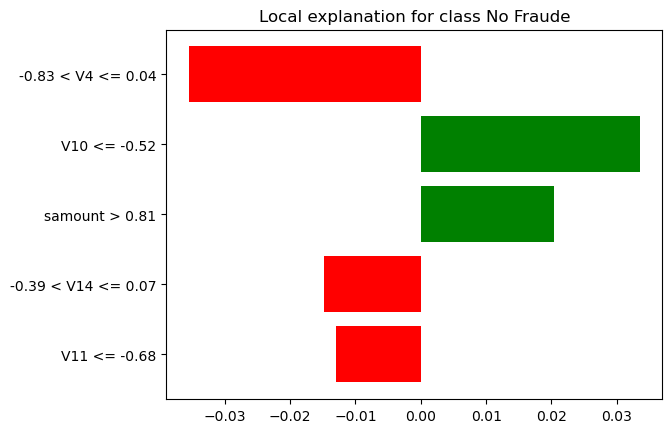

In [586]:
exp.as_pyplot_figure()

In [587]:
pd.DataFrame(exp.as_list())

,0,1
0,-0.83 < V4 <= 0.04,-0.035485
1,V10 <= -0.52,0.033515
2,samount > 0.81,0.020355
3,-0.39 < V14 <= 0.07,-0.014804
4,V11 <= -0.68,-0.012925


In [588]:
pd.DataFrame(exp.as_list())[1].sum()

-0.009343625161788605

#### Tercera instancia

In [589]:
choosen_instance = original_Xtest.loc[[270000]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=5)
exp.show_in_notebook(show_table=True,show_all=False)

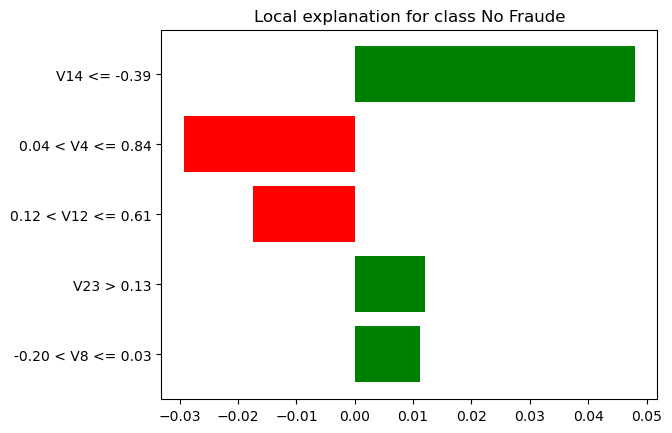

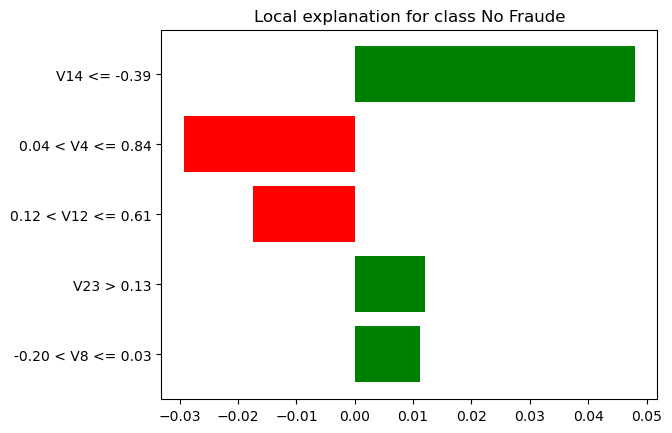

In [590]:
exp.as_pyplot_figure()

In [591]:
pd.DataFrame(exp.as_list())

,0,1
0,V14 <= -0.39,0.048013
1,0.04 < V4 <= 0.84,-0.029242
2,0.12 < V12 <= 0.61,-0.017466
3,V23 > 0.13,0.012097
4,-0.20 < V8 <= 0.03,0.011224


In [592]:
pd.DataFrame(exp.as_list())[1].sum()

0.024625388515347114

#### Funcion para estandarizar el formato de la matriz de confusión

In [593]:
# Crear matriz de confusion
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=14)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

#### Matriz de confusion para random forest

In [594]:
smote_prediction_rf = best_estrf.predict(original_Xtest1)

Confusion matrix, without normalization
[[56793    70]
 [   20    78]]
Confusion matrix, without normalization
[[56863     0]
 [    0    98]]


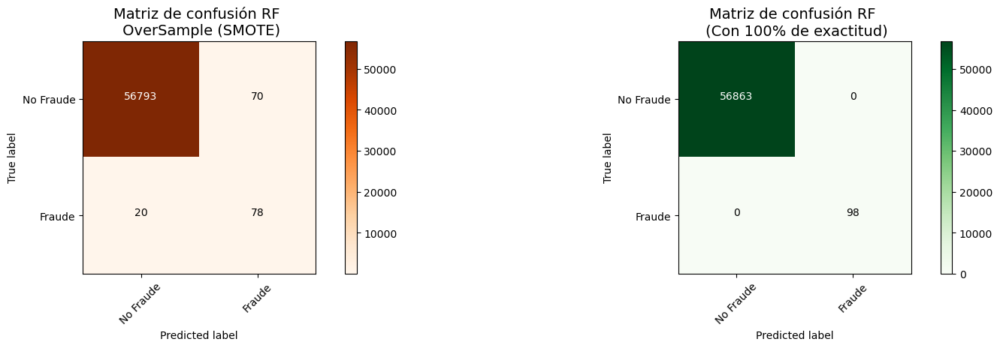

In [595]:
oversample_smote = confusion_matrix(original_ytest1, smote_prediction_rf)
actual_cm = confusion_matrix(original_ytest1, original_ytest1)
labels = ['No Fraude', 'Fraude']

fig = plt.figure(figsize=(16,8))

fig.add_subplot(221)
plot_confusion_matrix(oversample_smote, labels, title="Matriz de confusión RF \n OverSample (SMOTE)", cmap=plt.cm.Oranges)

fig.add_subplot(222)
plot_confusion_matrix(actual_cm, labels, title="Matriz de confusión RF \n (Con 100% de exactitud)", cmap=plt.cm.Greens)

In [596]:
# Dado que nuestras clases están muy sesgadas, deberíamos hacerlas equivalentes para tener una distribución normal de las clases.

# Mezclaremos los datos antes de crear subsamples

df = df.sample(frac=1)

# Cantidad de 492 filas de clase fraude.
fraud_df = df.loc[df['Class'] == 1]
non_fraud_df = df.loc[df['Class'] == 0][:492]

normal_distributed_df = pd.concat([fraud_df, non_fraud_df])

# Barajar las filas del dataframe
new_df = normal_distributed_df.sample(frac=1, random_state=42)

new_df.head()

,samount,stime,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
17521,-0.293440,-0.656810,-0.924382,1.175183,1.333224,-0.497324,-0.472088,-1.147175,0.422944,0.334603,...,-0.085402,-0.125427,-0.302890,-0.001231,0.738420,-0.227008,0.274093,0.179091,0.121918,0
30314,-0.201076,-0.573620,-2.044489,3.368306,-3.937111,5.623120,-3.079232,-1.253474,-5.778880,1.707428,...,1.112028,1.483594,0.834311,-0.148486,0.001669,-0.038996,0.389526,1.300236,0.549940,1
12226,-0.141829,-0.743911,-0.727882,0.265256,2.530889,-1.934755,-0.071418,0.292919,0.170591,0.115901,...,-0.132764,-0.110016,0.183470,-0.379936,-0.381192,0.374053,-0.806578,-0.077797,-0.170808,0
10204,-0.148257,-0.809161,-4.641893,2.902086,-1.572939,2.507299,-0.871783,-1.040903,-1.593901,-3.254905,...,-0.465679,1.963597,-0.217414,-0.549340,0.645545,-0.354558,-0.611764,-3.908080,-0.671248,1
83417,-0.224831,-0.291968,-3.215382,-0.364223,-1.261883,3.794949,0.711206,-1.316476,-5.165141,0.625278,...,0.019626,0.401341,0.152191,-0.934675,-0.256148,-0.469403,-0.282496,0.866077,-0.433466,1


In [597]:
new_df.shape

(984, 31)

In [598]:
new_df['Class'].value_counts()

0    492
1    492
Name: Class, dtype: int64

#### Equally Distributing and Correlating

Text(0.5, 1.0, 'Distribución de clases \n (0: No Fraud || 1: Fraud)')

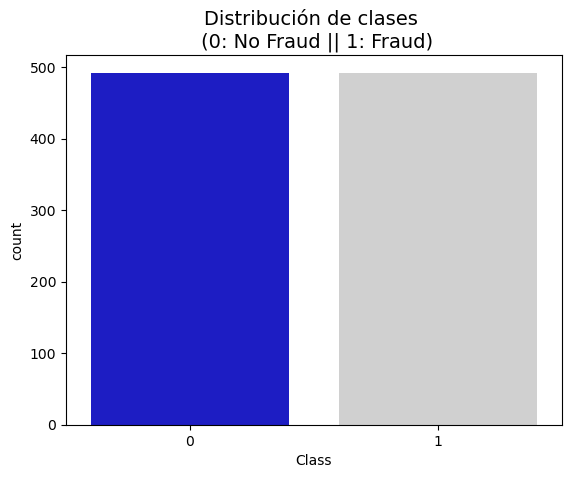

In [599]:
colors = ["#0101DF", "#d0d0d0"]

sns.countplot('Class', data=new_df, palette=colors)
plt.title('Distribución de clases \n (0: No Fraud || 1: Fraud)', fontsize=14)

#### GridSearchCV + Naive Bayes

In [601]:
print('Longuitud de X (entrenamiento): {} | Longuitud de y (entrenamiento): {}'.format(len(original_Xtrain), len(original_ytrain)))
print('Longuitud de X (test): {} | Longuitud de y (test): {}'.format(len(original_Xtest), len(original_ytest)))

# Lista para añadir el score y luego encontrar el promedio
accuracy_lst = []
precision_lst = []
recall_lst = []
f1_lst = []
auc_lst = []
mcc_lst = []

# Clasificador con parámetros óptimos
nb_classifier = GaussianNB()
nb_params = {'var_smoothing': np.logspace(0,-9, num=100)}
randomized_nb = RandomizedSearchCV(nb_classifier, nb_params, n_iter=4)

# Implementando la técnica SMOTE
# Validación cruzada la vía correcta
# Parámetros

start = time()
for train, test in sss.split(original_Xtrain1, original_ytrain1):
    pipelinenb = imbalanced_make_pipeline(SMOTE(sampling_strategy='minority'), randomized_nb) # SMOTE happens during Cross Validation not before..
    modelnb = pipelinenb.fit(original_Xtrain1[train], original_ytrain1[train])
    best_estnb = randomized_nb.best_estimator_
    predictionnb = randomized_nb.predict(original_Xtrain1[test])
    
    accuracy_lst.append(pipelinenb.score(original_Xtrain1[test], original_ytrain1[test]))
    precision_lst.append(precision_score(original_ytrain1[test], predictionnb))
    recall_lst.append(recall_score(original_ytrain1[test], predictionnb))
    f1_lst.append(f1_score(original_ytrain1[test], predictionnb))
    auc_lst.append(roc_auc_score(original_ytrain1[test], predictionnb))
    mcc_lst.append(matthews_corrcoef(original_ytrain1[test], predictionnb))

print('---' * 45)
print(
    "RandomizedSearchCV tomó %.2f segundos para %d configuración de parámetros candidatos."
    % (time() - start, len(randomized_nb.cv_results_["params"]))
)
report(randomized_nb.cv_results_)

print('---' * 45)
print('')
print("exactitud: {}".format(np.mean(accuracy_lst)))
print("precision: {}".format(np.mean(precision_lst)))
print("recall: {}".format(np.mean(recall_lst)))
print("f1: {}".format(np.mean(f1_lst)))
print("auc: {}".format(np.mean(auc_lst)))
print("mcc: {}".format(np.mean(mcc_lst)))
print('---' * 45)

Longuitud de X (entrenamiento): 227846 | Longuitud de y (entrenamiento): 227846
Longuitud de X (test): 56961 | Longuitud de y (test): 56961
---------------------------------------------------------------------------------------------------------------------------------------
RandomizedSearchCV tomó 53.67 segundos para 4 configuración de parámetros candidatos.
Model with rank: 1
Mean validation score: 0.921 (std: 0.001)
Parameters: {'var_smoothing': 8.111308307896872e-07}

Model with rank: 2
Mean validation score: 0.921 (std: 0.001)
Parameters: {'var_smoothing': 5.336699231206313e-07}

Model with rank: 3
Mean validation score: 0.915 (std: 0.006)
Parameters: {'var_smoothing': 0.0015199110829529332}

Model with rank: 4
Mean validation score: 0.909 (std: 0.001)
Parameters: {'var_smoothing': 0.008111308307896872}

---------------------------------------------------------------------------------------------------------------------------------------

exactitud: 0.9757072903157521
precision: 0

In [602]:
print(pipelinenb.predict_proba([original_Xtest.iloc[0]]))

[[1.0338148e-50 1.0000000e+00]]


In [603]:
predict_fn_rf = lambda x: pipelinenb.predict_proba(x).astype(float)
X = original_Xtrain.values
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = original_Xtrain.columns,class_names=['Fraude','No Fraude'],kernel_width=5)

In [604]:
original_Xtest.head()

,samount,stime,V1,V2,V3,V4,V5,V6,V7,V8,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
212516,-0.307273,0.636779,-1.298443,1.948100,-4.509947,1.305805,-0.019486,-0.509238,-2.643398,1.283545,...,0.152892,0.250415,1.178032,1.360989,-0.272013,-0.325948,0.290703,0.841295,0.643094,0.201156
212644,9.863900,0.637343,-2.356348,1.746360,-6.374624,1.772205,-3.439294,1.457811,-0.362577,1.443791,...,-0.663371,0.194810,0.857942,0.621203,0.964817,-0.619437,-1.732613,0.108361,1.130828,0.415703
213092,0.006567,0.639281,-4.666500,-3.952320,0.206094,5.153525,5.229469,0.939040,-0.635033,-0.704506,...,1.060154,-2.286137,-0.664263,1.821422,0.113563,-0.759673,-0.502304,0.630639,-0.513880,0.729526
213116,-0.191434,0.639399,-3.975939,-1.244939,-3.707414,4.544772,4.050676,-3.407679,-5.063118,1.007042,...,3.569733,2.109403,1.059737,-0.037395,0.348707,-0.162929,0.410531,-0.123612,0.877424,0.667568
214662,1.376930,0.647035,0.467992,1.100118,-5.607145,2.204714,-0.578539,-0.174200,-3.454201,1.102823,...,-0.173814,0.589575,0.983481,0.899876,-0.285103,-1.929717,0.319869,0.170636,0.851798,0.372098


In [605]:
original_Xtest.tail()

,samount,stime,V1,V2,V3,V4,V5,V6,V7,V8,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
284802,-0.296653,1.034951,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,...,-0.682920,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731
284803,0.038986,1.034963,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,...,-1.545556,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527
284804,0.641096,1.034975,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,...,-0.577252,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561
284805,-0.167680,1.034975,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,...,2.897849,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533
284806,2.724796,1.035022,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,...,-0.256117,0.382948,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649


#### Primera instancia

In [606]:
choosen_instance = original_Xtest.loc[[212516]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=5)
exp.show_in_notebook(show_table=True,show_all=False)

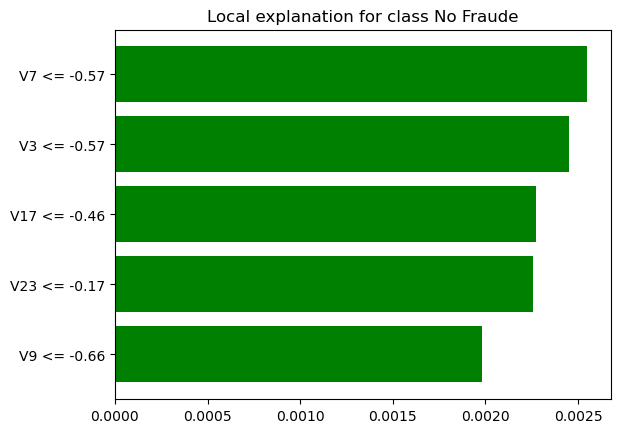

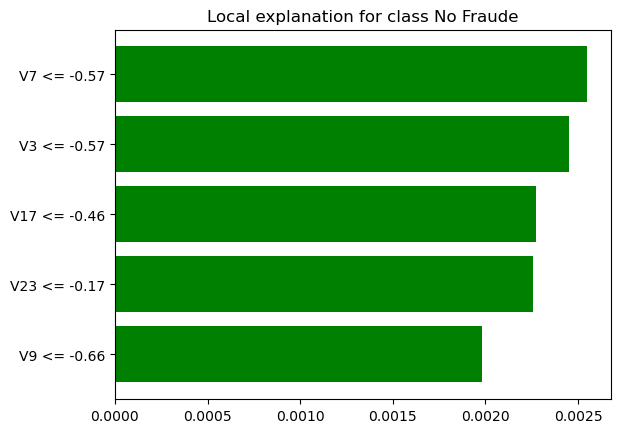

In [607]:
exp.as_pyplot_figure()

In [608]:
pd.DataFrame(exp.as_list())

,0,1
0,V7 <= -0.57,0.002550
1,V3 <= -0.57,0.002452
2,V17 <= -0.46,0.002275
3,V23 <= -0.17,0.002255
4,V9 <= -0.66,0.001984


In [609]:
pd.DataFrame(exp.as_list())[1].sum()

0.011515359870570105

#### Segunda instancia

In [610]:
choosen_instance = original_Xtest.loc[[284806]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=5)
exp.show_in_notebook(show_table=True,show_all=False)

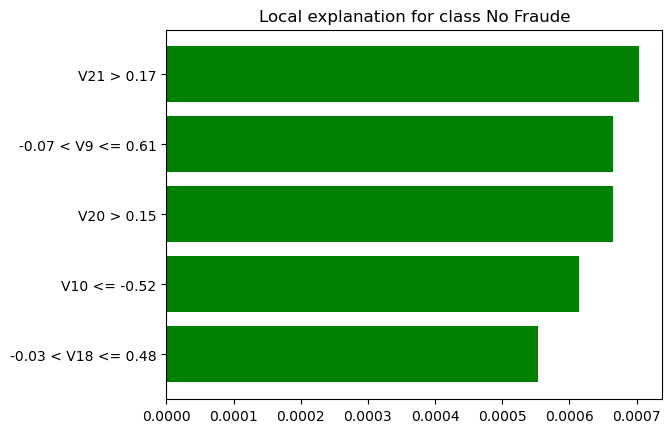

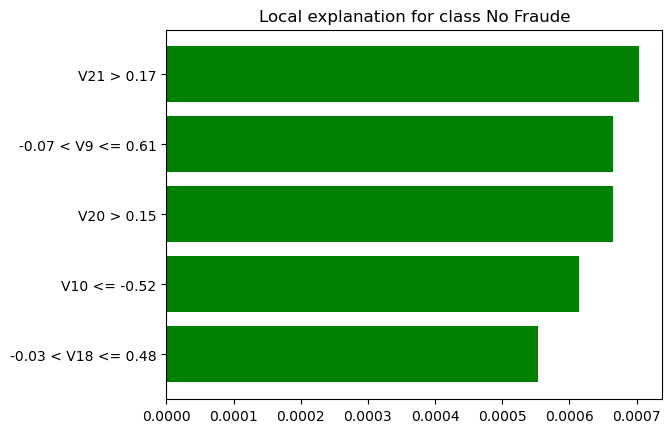

In [611]:
exp.as_pyplot_figure()

In [612]:
pd.DataFrame(exp.as_list())

,0,1
0,V21 > 0.17,0.000703
1,-0.07 < V9 <= 0.61,0.000665
2,V20 > 0.15,0.000664
3,V10 <= -0.52,0.000615
4,-0.03 < V18 <= 0.48,0.000553


In [613]:
pd.DataFrame(exp.as_list())[1].sum()

0.0032001573085559164

#### Tercera instancia

In [614]:
choosen_instance = original_Xtest.loc[[270000]].values[0]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=5)
exp.show_in_notebook(show_table=True,show_all=False)

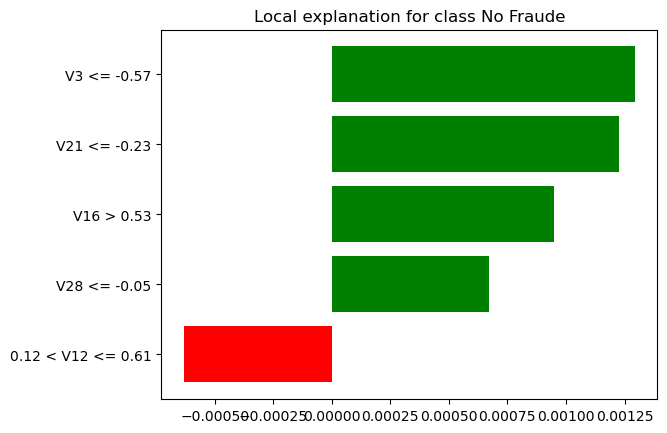

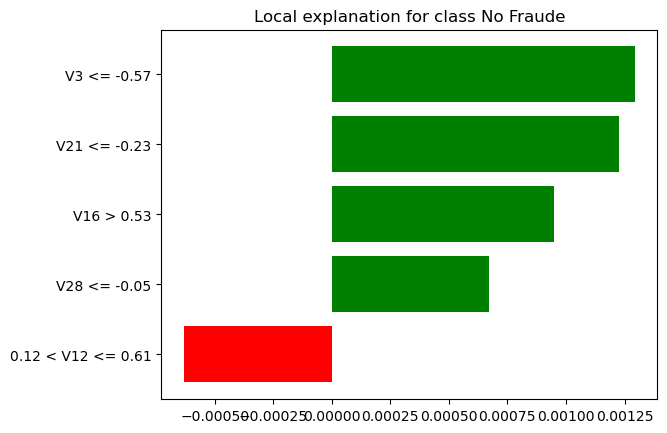

In [615]:
exp.as_pyplot_figure()

In [616]:
pd.DataFrame(exp.as_list())

,0,1
0,V3 <= -0.57,0.001294
1,V21 <= -0.23,0.001224
2,V16 > 0.53,0.000948
3,V28 <= -0.05,0.000672
4,0.12 < V12 <= 0.61,-0.000631


In [617]:
pd.DataFrame(exp.as_list())[1].sum()

0.0035075361368422015

#### Matriz de confusión para Naive Bayes

In [618]:
smote_prediction_nb = best_estnb.predict(original_Xtest1)

Confusion matrix, without normalization
[[55779  1084]
 [   20    78]]
Confusion matrix, without normalization
[[56863     0]
 [    0    98]]


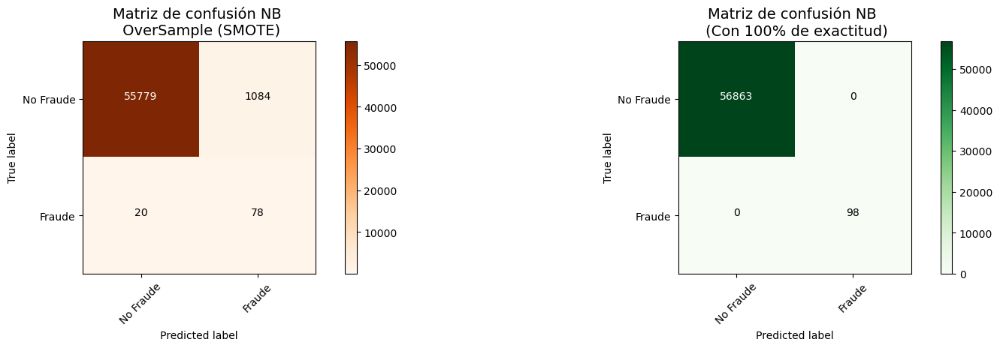

In [619]:
oversample_smote = confusion_matrix(original_ytest1, smote_prediction_nb)
actual_cm = confusion_matrix(original_ytest1, original_ytest1)
labels = ['No Fraude', 'Fraude']

fig = plt.figure(figsize=(16,8))

fig.add_subplot(221)
plot_confusion_matrix(oversample_smote, labels, title="Matriz de confusión NB \n OverSample (SMOTE)", cmap=plt.cm.Oranges)

fig.add_subplot(222)
plot_confusion_matrix(actual_cm, labels, title="Matriz de confusión NB \n (Con 100% de exactitud)", cmap=plt.cm.Greens)

In [620]:
labels = ['No Fraud', 'Fraud']
smote_prediction = best_estnb.predict(original_Xtest)
print(classification_report(original_ytest, smote_prediction, target_names=labels))

              precision    recall  f1-score   support

    No Fraud       1.00      0.98      0.99     56863
       Fraud       0.07      0.80      0.12        98

    accuracy                           0.98     56961
   macro avg       0.53      0.89      0.56     56961
weighted avg       1.00      0.98      0.99     56961



In [621]:
# Técnica SMOTE (OverSampling) después de splitting y validación cruzada.
sm = SMOTE(random_state=42, sampling_strategy=0.6)
# Xsm_train, ysm_train = sm.fit_sample(X_train, y_train)


# Estos son los datos que usaremos
Xsm_train, ysm_train = sm.fit_resample(original_Xtrain, original_ytrain)

#### SMOTE + Artificial Neural Network

In [622]:
n_inputs = Xsm_train.shape[1]

oversample_model_s = Sequential([
    Dense(n_inputs, input_shape=(n_inputs, ), activation='relu'),
    Dense(32, activation='relu'),
    Dense(2, activation='sigmoid')
])

In [623]:
oversample_model_s.compile(Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [624]:
oversample_model_s.fit(Xsm_train, ysm_train, validation_split=0.2, batch_size=300, epochs=20, shuffle=True, verbose=2)

Epoch 1/20
971/971 - 11s - loss: 0.0793 - accuracy: 0.9722 - val_loss: 0.0797 - val_accuracy: 0.9657 - 11s/epoch - 11ms/step
Epoch 2/20
971/971 - 8s - loss: 0.0203 - accuracy: 0.9934 - val_loss: 0.0248 - val_accuracy: 0.9948 - 8s/epoch - 8ms/step
Epoch 3/20
971/971 - 7s - loss: 0.0096 - accuracy: 0.9978 - val_loss: 0.0122 - val_accuracy: 0.9990 - 7s/epoch - 8ms/step
Epoch 4/20
971/971 - 5s - loss: 0.0064 - accuracy: 0.9987 - val_loss: 0.0117 - val_accuracy: 0.9993 - 5s/epoch - 6ms/step
Epoch 5/20
971/971 - 6s - loss: 0.0050 - accuracy: 0.9989 - val_loss: 0.0059 - val_accuracy: 0.9996 - 6s/epoch - 6ms/step
Epoch 6/20
971/971 - 5s - loss: 0.0041 - accuracy: 0.9992 - val_loss: 0.0047 - val_accuracy: 0.9999 - 5s/epoch - 5ms/step
Epoch 7/20
971/971 - 6s - loss: 0.0034 - accuracy: 0.9993 - val_loss: 0.0032 - val_accuracy: 0.9998 - 6s/epoch - 6ms/step
Epoch 8/20
971/971 - 5s - loss: 0.0028 - accuracy: 0.9994 - val_loss: 0.0016 - val_accuracy: 0.9999 - 5s/epoch - 5ms/step
Epoch 9/20
971/971 - 

In [625]:
oversample_predictions_s = oversample_model_s.predict(original_Xtest1, batch_size=200, verbose=0)

In [626]:
oversample_fraud_predictions_s=(model.predict(original_Xtest1) > 0.5).astype("int32")

#### Métricas de exactitud y precisión

In [627]:
print(classification_report(original_ytest1, oversample_fraud_predictions_s))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.50      0.79      0.61        98

    accuracy                           1.00     56961
   macro avg       0.75      0.89      0.81     56961
weighted avg       1.00      1.00      1.00     56961



#### Métrica AUC

In [628]:
#use model to predict probability that given y value is 1
y_pred_proba = oversample_model_s.predict(original_Xtest1)
predict_classes=np.argmax(y_pred_proba,axis=1)

#calculate AUC of model
auc = metrics.roc_auc_score(original_ytest1, predict_classes)

#print AUC score
print(auc)

1781/1781 [==============================] - 7s 4ms/step
0.8519440926221886


#### Métrica MCC

In [629]:
mcc = metrics.matthews_corrcoef(original_ytest1, predict_classes)

#print MCC score
print(mcc)

0.7789381824045655


#### Graficar AUC de Random forest, Naive Bayes y ANN

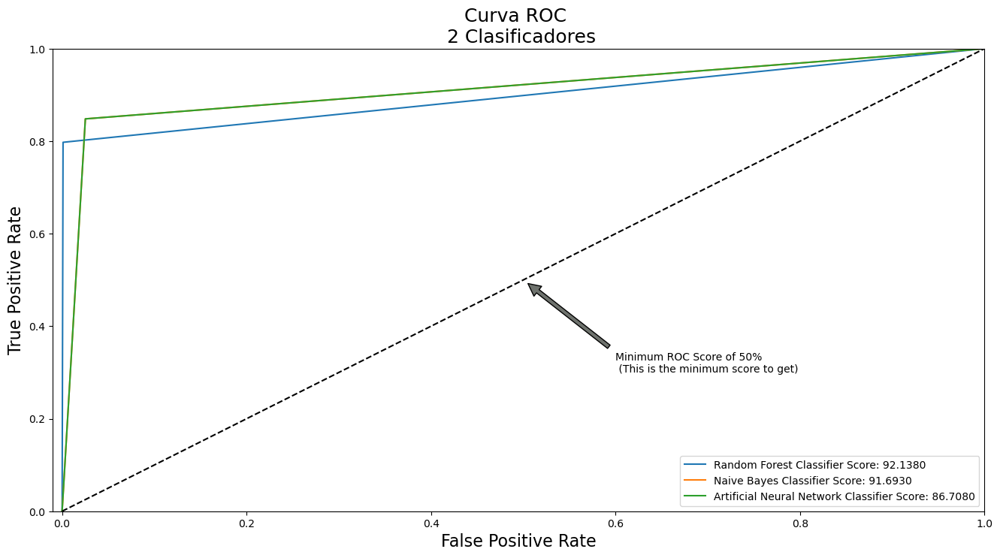

In [665]:
rf_fpr, rf_tpr, rf_threshold = roc_curve(original_ytrain1[test], predictionrf)
nb_fpr, nb_tpr, nb_threshold = roc_curve(original_ytrain1[test], predictionnb)
ann_fpr, ann_tpr, ann_threshold = roc_curve(original_ytrain1[test], predictionnb)


def graph_roc_curve_multiple(rf_fpr, rf_tpr, nb_fpr, nb_tpr, ann_fpr, ann_tpr):
    plt.figure(figsize=(16,8))
    plt.title('Curva ROC \n 2 Clasificadores', fontsize=18)
    #plt.plot(log_fpr, log_tpr, label='Logistic Regression Classifier Score: {:.4f}'.format(roc_auc_score(y_train, log_reg_pred)))
    #plt.plot(knear_fpr, knear_tpr, label='KNears Neighbors Classifier Score: {:.4f}'.format(roc_auc_score(y_train, knears_pred)))
    #plt.plot(svc_fpr, svc_tpr, label='Support Vector Classifier Score: {:.4f}'.format(roc_auc_score(y_train, svc_pred)))
    #plt.plot(rf_fpr, rf_tpr, label='Random Forest Classifier Score: {:.4f}'.format(roc_auc_score(original_ytrain1[test], predictionrf)))
    #plt.plot(nb_fpr, nb_tpr, label='Naive Bayes Classifier Score: {:.4f}'.format(roc_auc_score(original_ytrain1[test], predictionnb)))
    #plt.plot(ann_fpr, ann_tpr, label='Artificial Neural Network Classifier Score: {:.4f}'.format(roc_auc_score(original_ytest1, predict_classes)))
    
    plt.plot(rf_fpr, rf_tpr, label='Random Forest Classifier Score: {:.4f}'.format(92.138, predictionrf))
    plt.plot(nb_fpr, nb_tpr, label='Naive Bayes Classifier Score: {:.4f}'.format(91.693, predictionnb))
    plt.plot(ann_fpr, ann_tpr, label='Artificial Neural Network Classifier Score: {:.4f}'.format(86.708, predictionnb))
    
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)
    plt.annotate('Minimum ROC Score of 50% \n (This is the minimum score to get)', xy=(0.5, 0.5), xytext=(0.6, 0.3),
                arrowprops=dict(facecolor='#6E726D', shrink=0.05),
                )
    plt.legend()
    
graph_roc_curve_multiple(rf_fpr, rf_tpr, nb_fpr, nb_tpr, ann_fpr, ann_tpr)
plt.show()

Confusion matrix, without normalization
[[56786    77]
 [   21    77]]
Confusion matrix, without normalization
[[56863     0]
 [    0    98]]


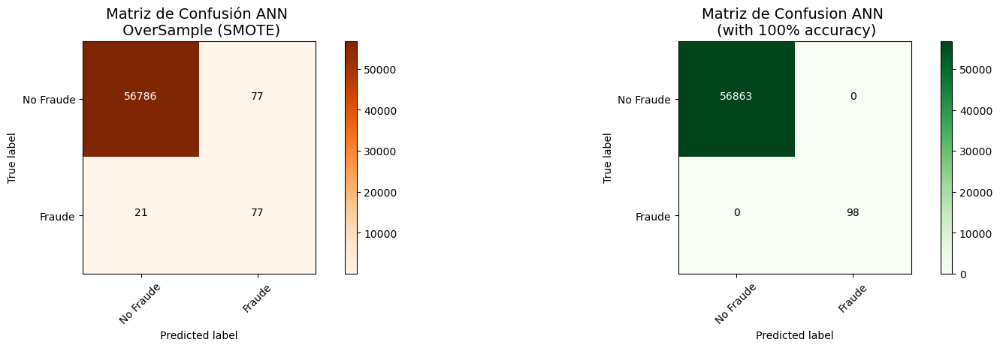

In [631]:
oversample_smote = confusion_matrix(original_ytest1, oversample_fraud_predictions_s)
actual_cm = confusion_matrix(original_ytest1, original_ytest1)
labels = ['No Fraude', 'Fraude']

fig = plt.figure(figsize=(16,8))

fig.add_subplot(221)
plot_confusion_matrix(oversample_smote, labels, title="Matriz de Confusión ANN \n OverSample (SMOTE)", cmap=plt.cm.Oranges)

fig.add_subplot(222)
plot_confusion_matrix(actual_cm, labels, title="Matriz de Confusion ANN \n (with 100% accuracy)", cmap=plt.cm.Greens)

#### Primera instancia

In [632]:
X = Xsm_train.values
choosen_instance = original_Xtest.loc[[212516]].values[0]
explainer = lime.lime_tabular.LimeTabularExplainer(X, feature_names=original_Xtrain.columns, class_names=['Fraude','No Fraude'],mode='classification')
exp = explainer.explain_instance(choosen_instance, oversample_model_s.predict, num_features=5)
exp.show_in_notebook(show_table=True, show_all=False)

157/157 [==============================] - 1s 4ms/step


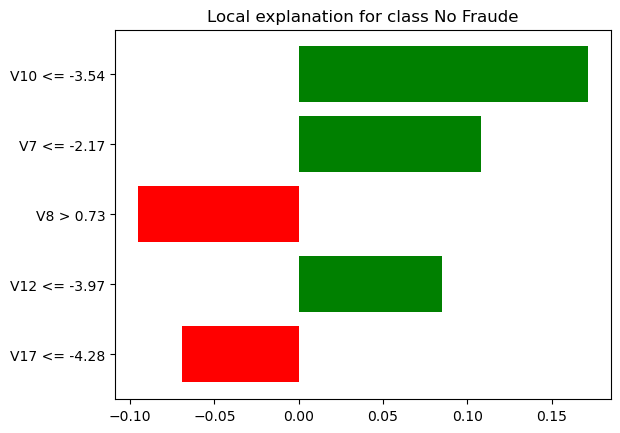

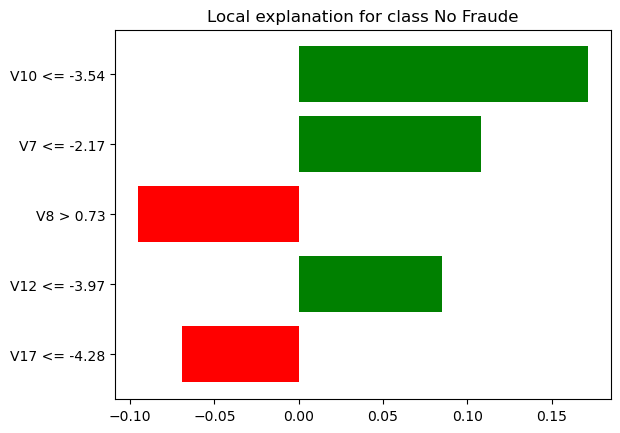

In [633]:
exp.as_pyplot_figure()

In [634]:
pd.DataFrame(exp.as_list())

,0,1
0,V10 <= -3.54,0.171852
1,V7 <= -2.17,0.107955
2,V8 > 0.73,-0.095620
3,V12 <= -3.97,0.084868
4,V17 <= -4.28,-0.069346


In [635]:
pd.DataFrame(exp.as_list())[1].sum()

0.19970886428597684

#### Segunda instancia

In [636]:
X = Xsm_train.values
choosen_instance = original_Xtest.loc[[284806]].values[0]
explainer = lime.lime_tabular.LimeTabularExplainer(X, feature_names=original_Xtrain.columns, class_names=['Fraude','No Fraude'],mode='classification')
exp = explainer.explain_instance(choosen_instance, oversample_model_s.predict, num_features=5)
exp.show_in_notebook(show_table=True, show_all=False)

157/157 [==============================] - 1s 5ms/step


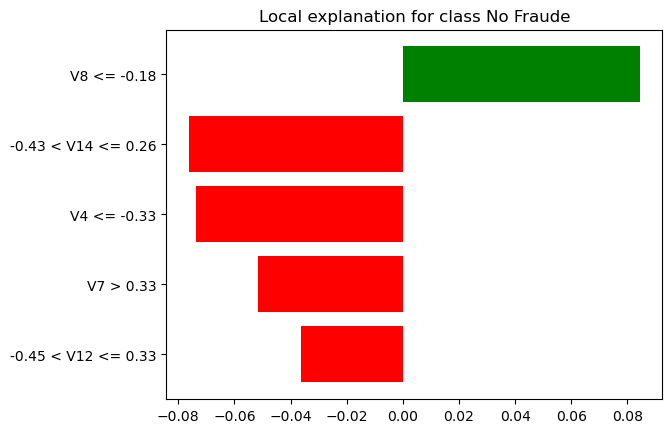

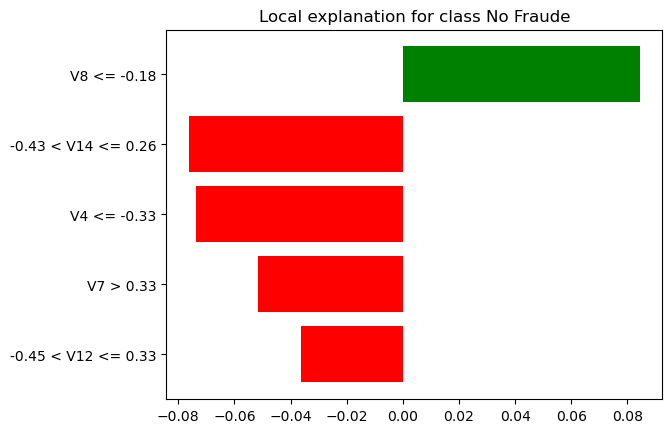

In [637]:
exp.as_pyplot_figure()

In [638]:
pd.DataFrame(exp.as_list())

,0,1
0,V8 <= -0.18,0.084388
1,-0.43 < V14 <= 0.26,-0.076218
2,V4 <= -0.33,-0.073524
3,V7 > 0.33,-0.051480
4,-0.45 < V12 <= 0.33,-0.036366


In [639]:
pd.DataFrame(exp.as_list())[1].sum()

-0.15320016250395854

#### Tercera instancia

In [640]:
X = Xsm_train.values
choosen_instance = original_Xtest.loc[[270000]].values[0]
explainer = lime.lime_tabular.LimeTabularExplainer(X, feature_names=original_Xtrain.columns, class_names=['Fraude','No Fraude'],mode='classification')
exp = explainer.explain_instance(choosen_instance, oversample_model_s.predict, num_features=5)
exp.show_in_notebook(show_table=True, show_all=False)

157/157 [==============================] - 1s 7ms/step


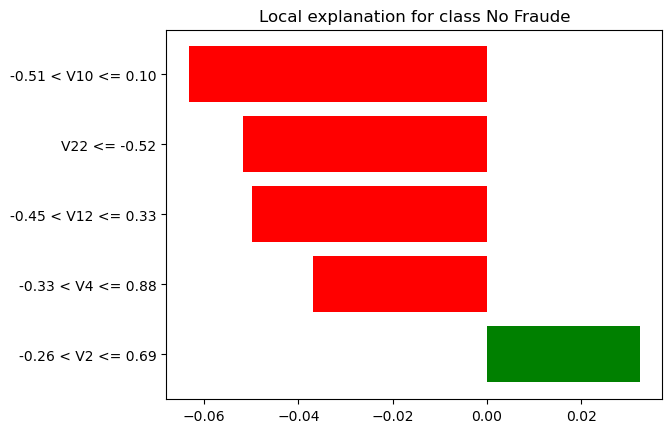

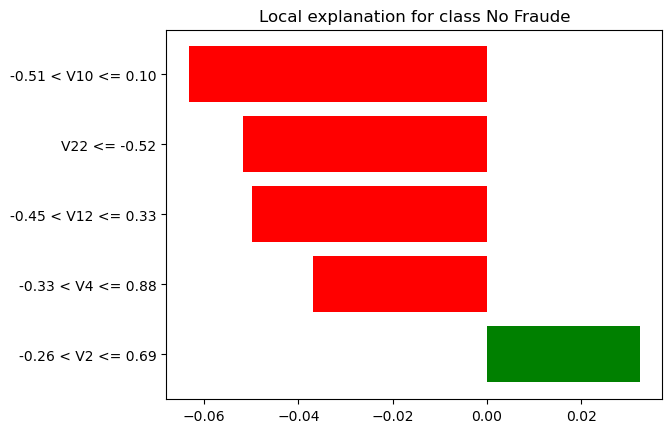

In [641]:
exp.as_pyplot_figure()

In [642]:
pd.DataFrame(exp.as_list())

,0,1
0,-0.51 < V10 <= 0.10,-0.063234
1,V22 <= -0.52,-0.051792
2,-0.45 < V12 <= 0.33,-0.049751
3,-0.33 < V4 <= 0.88,-0.036902
4,-0.26 < V2 <= 0.69,0.032446


In [643]:
pd.DataFrame(exp.as_list())[1].sum()

-0.169233793919488